In [8]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import zipfile

zip_path = "/content/drive/MyDrive/ISIC_data/skin-cancer9-classesisic.zip"
extract_path = "/content/drive/MyDrive/ISIC_data/extracted/"

os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as z:
    z.extractall(extract_path)

print("Extracted!")


In [15]:
train_df["filepath"].head()


,filepath
0,/content/drive/MyDrive/ISIC_data/extracted/Ski...
1,/content/drive/MyDrive/ISIC_data/extracted/Ski...
2,/content/drive/MyDrive/ISIC_data/extracted/Ski...
3,/content/drive/MyDrive/ISIC_data/extracted/Ski...
4,/content/drive/MyDrive/ISIC_data/extracted/Ski...


**1. VERİ YÜKLEME**

**1.1. Kütüphaneler**

In [17]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**1.2. Tüm Görüntüleri DataFrame’e Yükleme**

In [10]:
image_root = "/content/drive/MyDrive/ISIC_data/extracted/Skin cancer ISIC The International Skin Imaging Collaboration/Train"

filepaths = []
labels = []

for label in os.listdir(image_root):
    class_path = os.path.join(image_root, label)
    if os.path.isdir(class_path):
        for file in os.listdir(class_path):
            if file.lower().endswith((".jpg",".jpeg",".png")):
                filepaths.append(os.path.join(class_path, file))
                labels.append(label)

train_df = pd.DataFrame({
    "filepath": filepaths,
    "label": labels
})

train_df.head()


,filepath,label
0,/content/drive/MyDrive/ISIC_data/extracted/Ski...,actinic keratosis
1,/content/drive/MyDrive/ISIC_data/extracted/Ski...,actinic keratosis
2,/content/drive/MyDrive/ISIC_data/extracted/Ski...,actinic keratosis
3,/content/drive/MyDrive/ISIC_data/extracted/Ski...,actinic keratosis
4,/content/drive/MyDrive/ISIC_data/extracted/Ski...,actinic keratosis


**1.3. Toplam görüntü sayısı**

In [11]:
print("Toplam görüntü sayısı:", len(train_df))


Toplam görüntü sayısı: 2239


**Görüntü çözünürlüğü, kanal sayısı, dosya boyutu**

In [19]:
import cv2
import os
from tqdm.notebook import tqdm

heights = []
widths = []
channels = []
filesizes = []

for fp in tqdm(train_df["filepath"], desc="Görüntü Özellikleri Yükleniyor"): # tqdm eklendi
    img = cv2.imread(fp)
    h, w, c = img.shape
    heights.append(h)
    widths.append(w)
    channels.append(c)
    filesizes.append(os.path.getsize(fp)/1024)

train_df["height"] = heights
train_df["width"] = widths
train_df["channels"] = channels
train_df["filesize_kb"] = filesizes

train_df.head()

Görüntü Özellikleri Yükleniyor:   0%|          | 0/2239 [00:00<?, ?it/s]

,filepath,label,height,width,channels,filesize_kb
0,/content/drive/MyDrive/ISIC_data/extracted/Ski...,actinic keratosis,450,600,3,254.826172
1,/content/drive/MyDrive/ISIC_data/extracted/Ski...,actinic keratosis,450,600,3,305.413086
2,/content/drive/MyDrive/ISIC_data/extracted/Ski...,actinic keratosis,450,600,3,287.517578
3,/content/drive/MyDrive/ISIC_data/extracted/Ski...,actinic keratosis,450,600,3,266.640625
4,/content/drive/MyDrive/ISIC_data/extracted/Ski...,actinic keratosis,450,600,3,254.510742


**Çözünürlük dağılımı grafikleri**

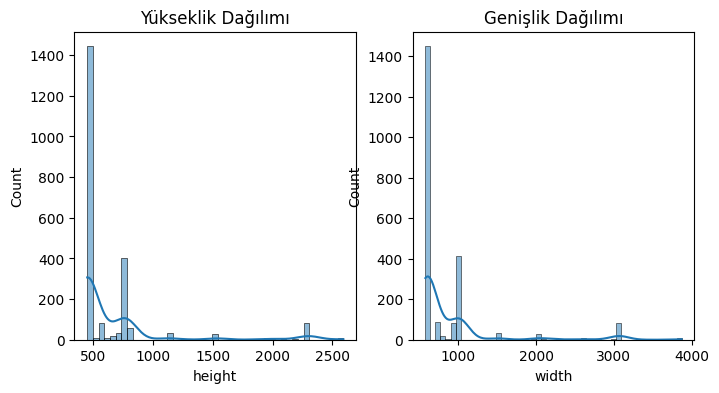

In [30]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
sns.histplot(train_df["height"], kde=True)
plt.title("Yükseklik Dağılımı")

plt.subplot(1,2,2)
sns.histplot(train_df["width"], kde=True)
plt.title("Genişlik Dağılımı")

plt.show()

Kanal sayısı


In [31]:
train_df["channels"].value_counts()


,count
channels,
3,2239


**BÖLÜM 2 — Görüntü Yükleme ve Görselleştirme**

**2.1. Rastgele 9 Görüntünün RGB ve Grayscale Gösterimi**

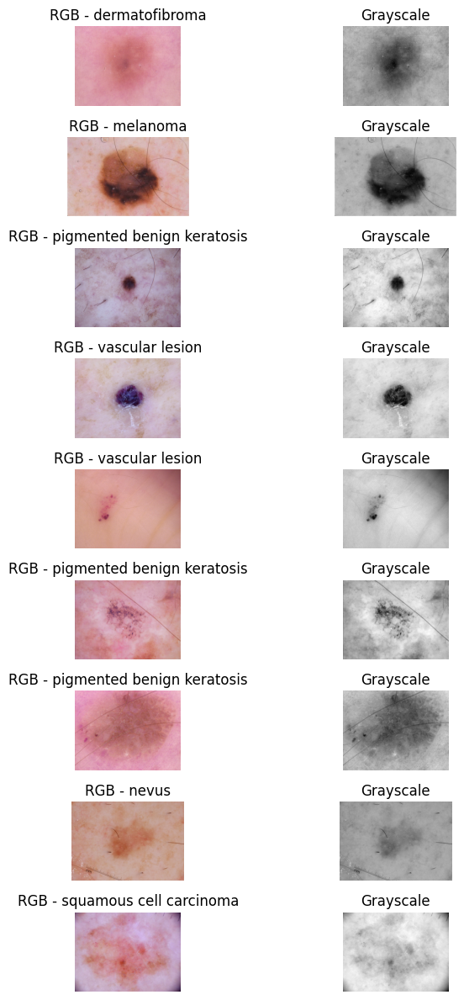

In [32]:
import random

# 9 rastgele görüntü seç
sample_df = train_df.sample(9).reset_index(drop=True)

plt.figure(figsize=(8, 12))

for i, fp in enumerate(sample_df["filepath"]):
    img_rgb = cv2.imread(fp)
    img_rgb = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    # RGB
    plt.subplot(9, 2, 2*i + 1)
    plt.imshow(img_rgb)
    plt.title(f"RGB - {sample_df['label'][i]}")
    plt.axis("off")

    # Grayscale
    plt.subplot(9, 2, 2*i + 2)
    plt.imshow(img_gray, cmap="gray")
    plt.title("Grayscale")
    plt.axis("off")

plt.tight_layout()
plt.show()

**2.2. İstatistiksel Özellikler (min, max, mean, std)**

In [33]:
stats = []

for fp in sample_df["filepath"]:
    img_rgb = cv2.imread(fp)
    img_rgb = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    stats.append([
        fp,
        img_rgb.min(), img_rgb.max(), img_rgb.mean(), img_rgb.std(),
        img_gray.min(), img_gray.max(), img_gray.mean(), img_gray.std()
    ])

columns = [
    "filepath",
    "RGB_min", "RGB_max", "RGB_mean", "RGB_std",
    "Gray_min", "Gray_max", "Gray_mean", "Gray_std"
]

stats_df = pd.DataFrame(stats, columns=columns)
stats_df


,filepath,RGB_min,RGB_max,RGB_mean,RGB_std,Gray_min,Gray_max,Gray_mean,Gray_std
0,/content/drive/MyDrive/ISIC_data/extracted/Ski...,77,255,174.876616,34.504912,103,220,169.842619,15.542968
1,/content/drive/MyDrive/ISIC_data/extracted/Ski...,16,255,158.883093,51.569005,30,255,159.111656,44.601164
2,/content/drive/MyDrive/ISIC_data/extracted/Ski...,12,216,160.808021,24.240653,23,195,155.905926,21.559849
3,/content/drive/MyDrive/ISIC_data/extracted/Ski...,4,255,181.653952,30.948285,16,223,178.287874,30.631701
4,/content/drive/MyDrive/ISIC_data/extracted/Ski...,42,242,166.472483,33.224728,69,201,166.613137,17.168666
5,/content/drive/MyDrive/ISIC_data/extracted/Ski...,42,228,169.593141,31.062094,60,206,165.466441,17.088830
6,/content/drive/MyDrive/ISIC_data/extracted/Ski...,41,255,161.593623,40.714538,68,227,156.450722,23.207713
7,/content/drive/MyDrive/ISIC_data/extracted/Ski...,1,255,158.303442,30.501982,23,251,160.424330,14.078566
8,/content/drive/MyDrive/ISIC_data/extracted/Ski...,4,239,173.223743,29.136201,13,203,167.058074,18.183592


**2.3. Histogramlar (RGB ve Grayscale)**

Bu kod 9 görüntünün her biri için:

R kanalı histogramı

G kanalı histogramı

B kanalı histogramı

Grayscale histogramı çizer.

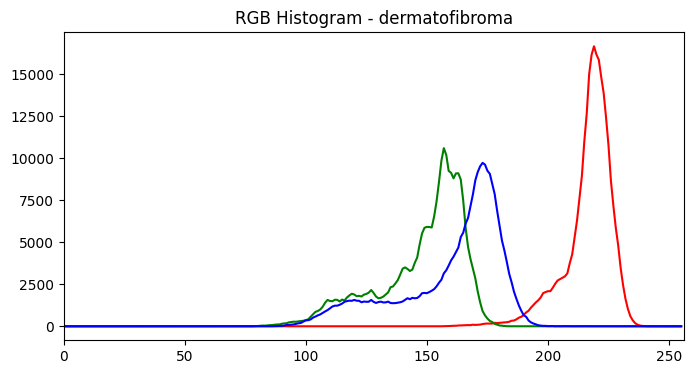

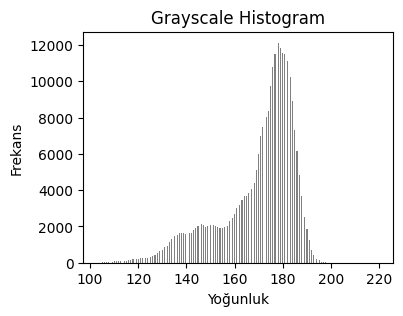

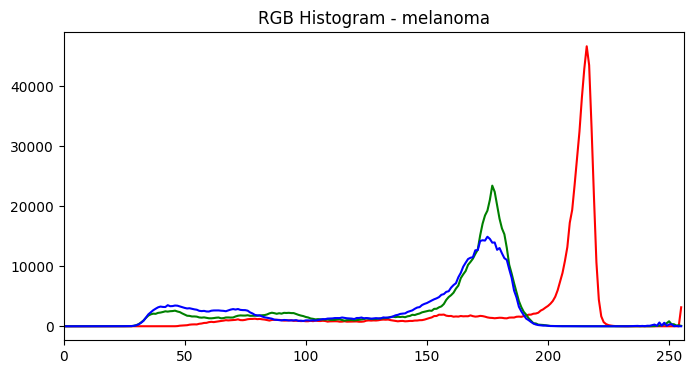

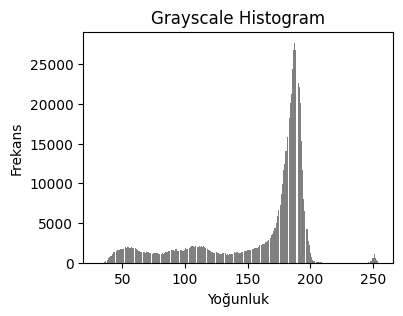

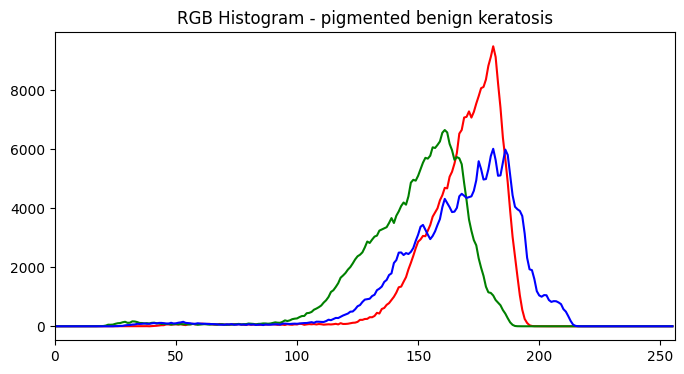

...

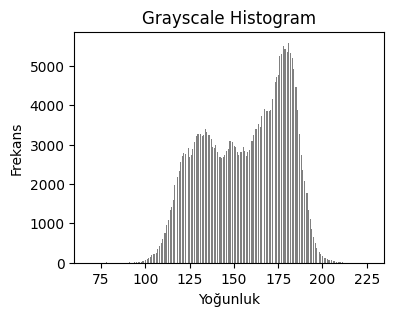

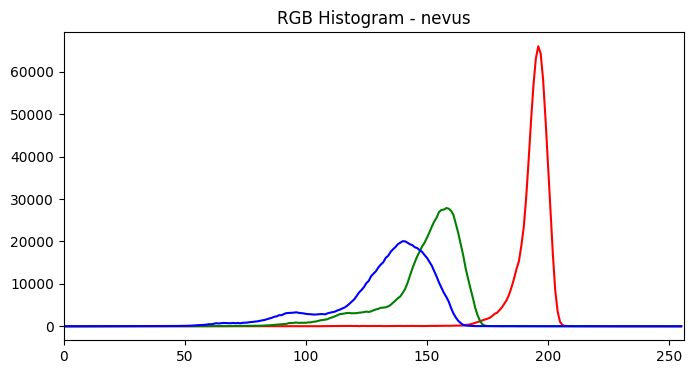

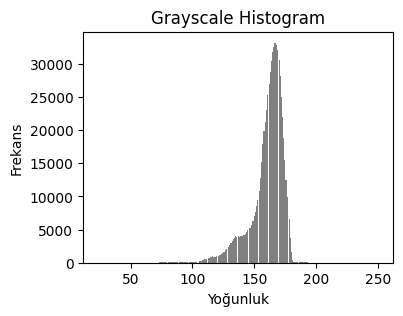

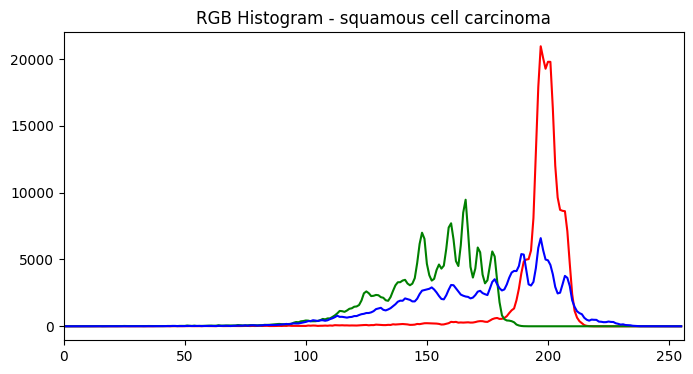

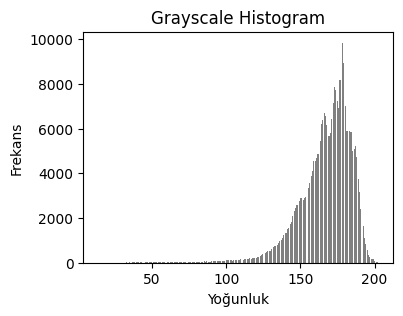

In [34]:
for i, fp in enumerate(sample_df["filepath"]):
    img_rgb = cv2.imread(fp)
    img_rgb = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    plt.figure(figsize=(8,4))

    # RGB için 3 kanal
    colors = ("r","g","b")
    for idx, col in enumerate(colors):
        hist = cv2.calcHist([img_rgb],[idx],None,[256],[0,256])
        plt.plot(hist, color=col)
        plt.xlim([0,256])
    plt.title(f"RGB Histogram - {sample_df['label'][i]}")
    plt.show()

    # Grayscale histogram
    plt.figure(figsize=(4,3))
    plt.hist(img_gray.ravel(), bins=256, color='gray')
    plt.title("Grayscale Histogram")
    plt.xlabel("Yoğunluk")
    plt.ylabel("Frekans")
    plt.show()

**BÖLÜM 3 – Görüntü İşleme ve İyileştirme**

**3.1. Kontrast Germe (Contrast Stretching)**

RGB için: Her kanal ayrı ayrı esnetilir

Grayscale için: Tek kanal esnetilir

**Fonksiyon: Kontrast Germe**

In [35]:
def contrast_stretch(img):
    p_min = np.percentile(img, 1)
    p_max = np.percentile(img, 99)
    stretched = (img - p_min) * (255 / (p_max - p_min))
    stretched = np.clip(stretched, 0, 255)
    return stretched.astype(np.uint8)


**9 görüntü için RGB ve Gray uygulama**

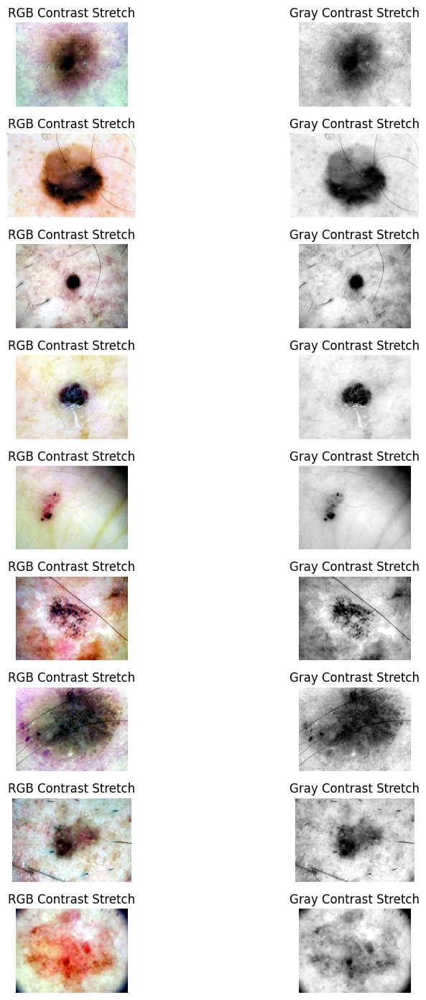

In [36]:
plt.figure(figsize=(10, 14))

for i, fp in enumerate(sample_df["filepath"]):
    img = cv2.imread(fp)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    # RGB için her kanalı ayrı ayrı stretch et
    r, g, b = cv2.split(img_rgb)
    r_s = contrast_stretch(r)
    g_s = contrast_stretch(g)
    b_s = contrast_stretch(b)
    rgb_stretched = cv2.merge([r_s, g_s, b_s])

    # Grayscale stretch
    gray_stretched = contrast_stretch(img_gray)

    # Gösterim
    plt.subplot(9, 2, 2*i+1)
    plt.imshow(rgb_stretched)
    plt.title("RGB Contrast Stretch")
    plt.axis("off")

    plt.subplot(9, 2, 2*i+2)
    plt.imshow(gray_stretched, cmap="gray")
    plt.title("Gray Contrast Stretch")
    plt.axis("off")

plt.tight_layout()
plt.show()

**3.2. Histogram Eşitleme (Histogram Equalization)**

RGB için:

RGB → YCrCb

Y kanalına equalization

Geri RGB’ye dönüş

Grayscale için:

Direkt equalize

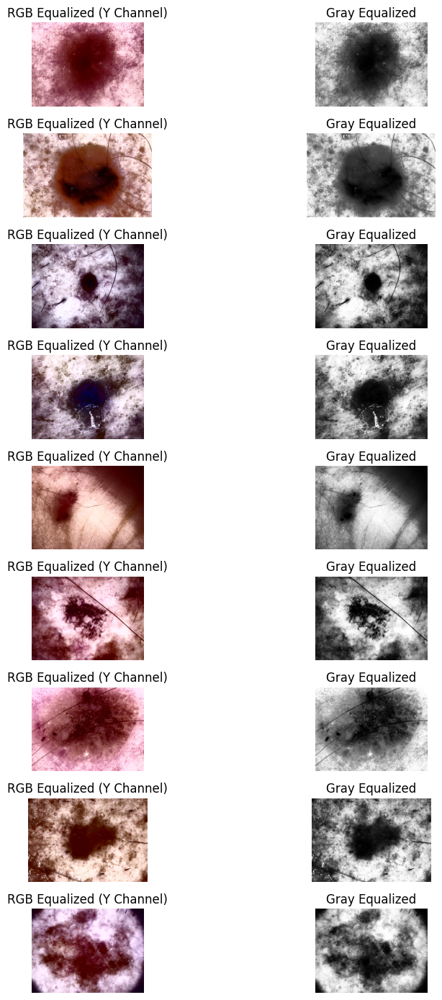

In [37]:
plt.figure(figsize=(10, 14))

for i, fp in enumerate(sample_df["filepath"]):
    img = cv2.imread(fp)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    # RGB → YCrCb
    ycrcb = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YCrCb)
    y, cr, cb = cv2.split(ycrcb)

    # Y kanalına equalize
    y_eq = cv2.equalizeHist(y)

    # Birleştir
    ycrcb_eq = cv2.merge([y_eq, cr, cb])
    rgb_eq = cv2.cvtColor(ycrcb_eq, cv2.COLOR_YCrCb2RGB)

    # Grayscale equalization
    gray_eq = cv2.equalizeHist(img_gray)

    # Göster
    plt.subplot(9, 2, 2*i+1)
    plt.imshow(rgb_eq)
    plt.title("RGB Equalized (Y Channel)")
    plt.axis("off")

    plt.subplot(9, 2, 2*i+2)
    plt.imshow(gray_eq, cmap="gray")
    plt.title("Gray Equalized")
    plt.axis("off")

plt.tight_layout()
plt.show()

**3.3. Gamma Düzeltme (0.5 – 1.0 – 2.0)**

Gamma < 1 → Görüntü parlaklaşır

Gamma > 1 → Görüntü kararır

Fonksiyon:

In [38]:
def gamma_correct(img, gamma):
    inv = 1.0 / gamma
    table = np.array([(i/255)**inv * 255 for i in range(256)]).astype("uint8")
    return cv2.LUT(img, table)


9 görüntü için gamma 0.5 – 1.0 – 2.0

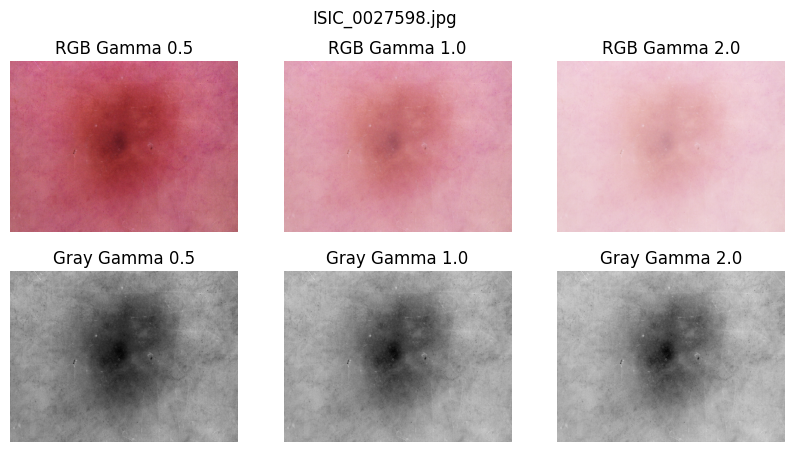

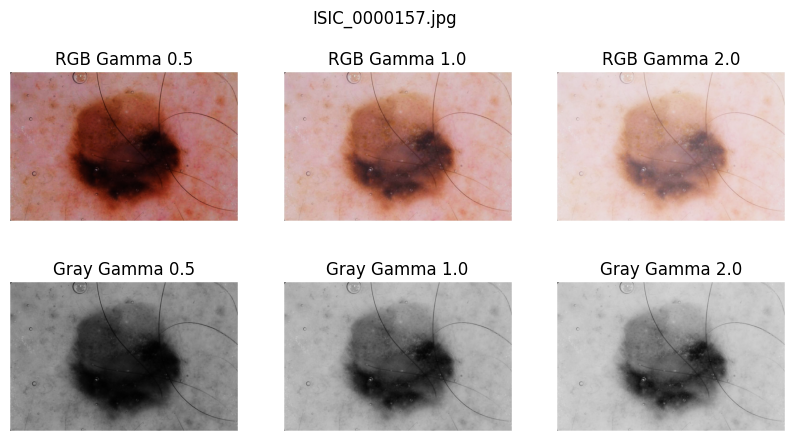

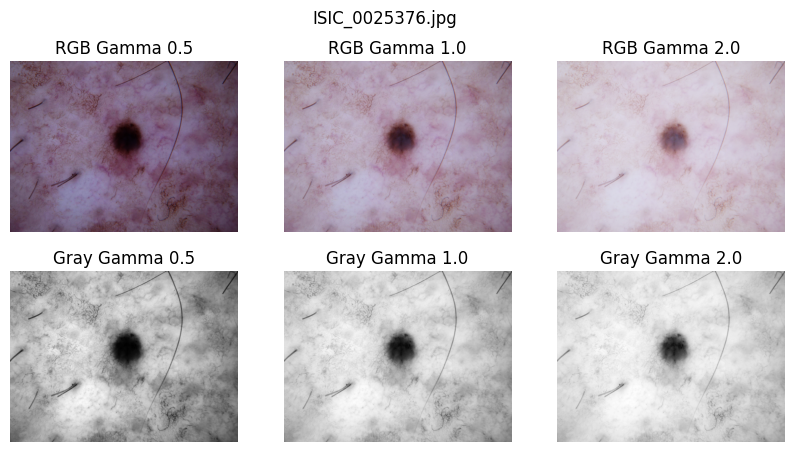

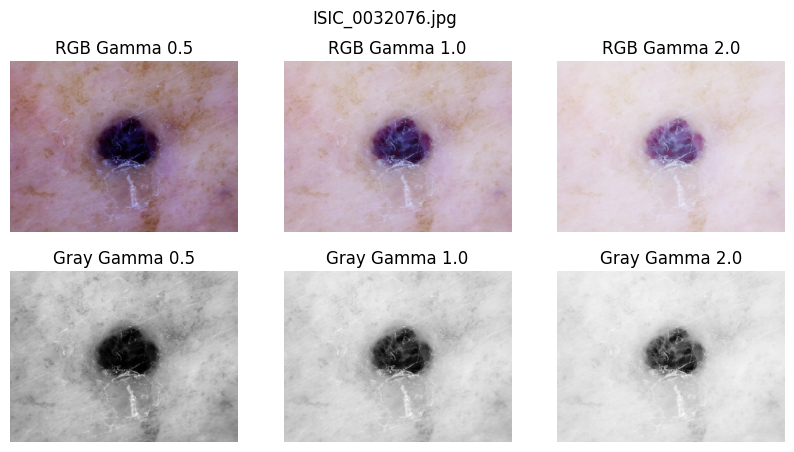

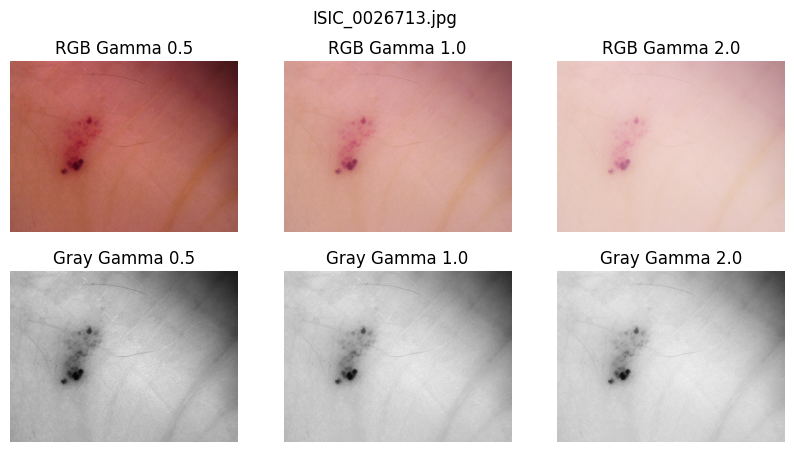

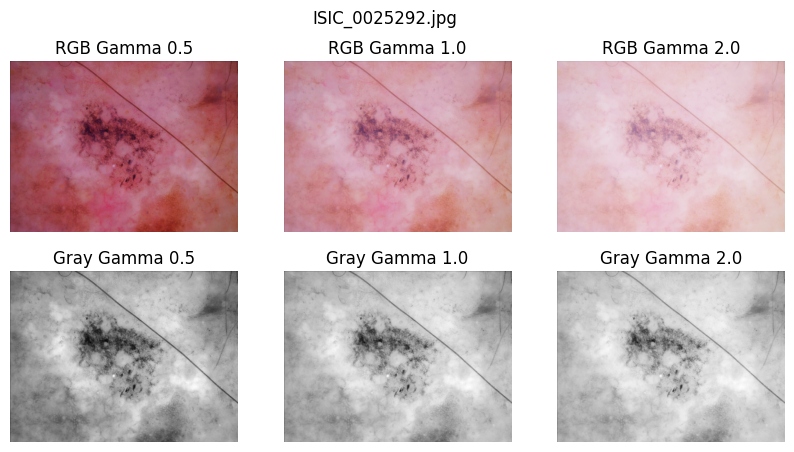

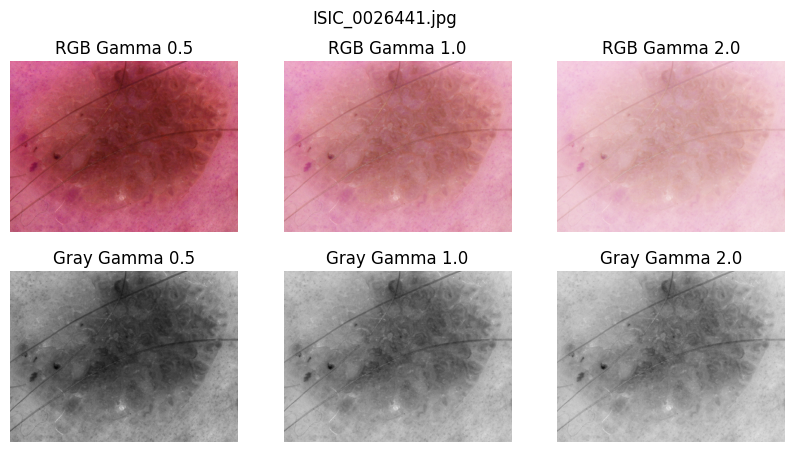

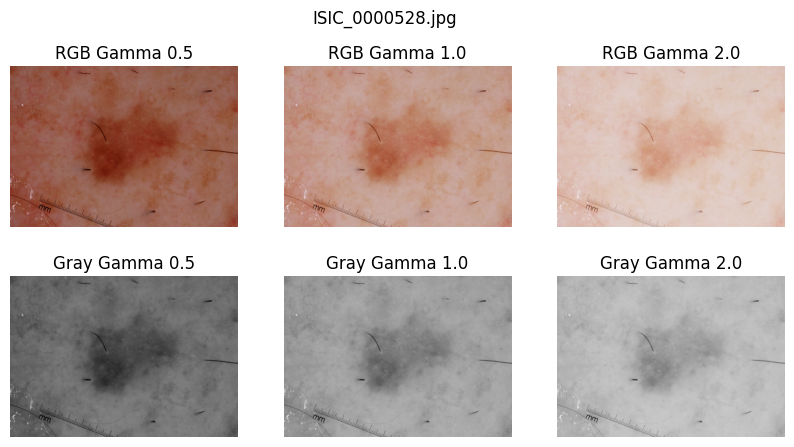

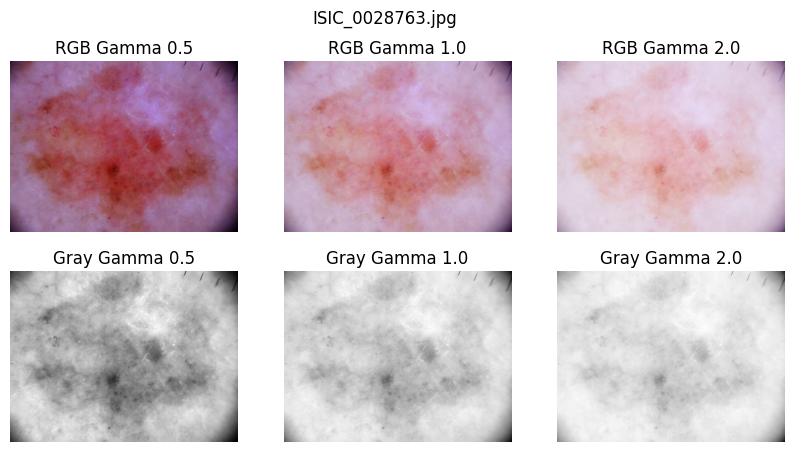

In [39]:
gammas = [0.5, 1.0, 2.0]

for fp in sample_df["filepath"]:
    img = cv2.imread(fp)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    plt.figure(figsize=(10,5))
    plt.suptitle(fp.split('/')[-1])

    for i, g in enumerate(gammas):
        rgb_g = gamma_correct(img_rgb, g)
        gray_g = gamma_correct(img_gray, g)

        plt.subplot(2,3,i+1)
        plt.imshow(rgb_g)
        plt.title(f"RGB Gamma {g}")
        plt.axis("off")

        plt.subplot(2,3,i+4)
        plt.imshow(gray_g, cmap='gray')
        plt.title(f"Gray Gamma {g}")
        plt.axis("off")

    plt.show()

**BÖLÜM 4 — GÜRÜLTÜ AZALTMA**

Bu bölümde yine sample_df (rasgele 9 görüntü) üzerinden filtre uygulayacağız.

**4.1. Median Blur Uygulama**

Median Blur:

- Gürültüyü azaltır

- Kenarları korur (Gaussian’a göre daha iyidir)

- Özellikle tuz-biber gürültüsünde etkilidir

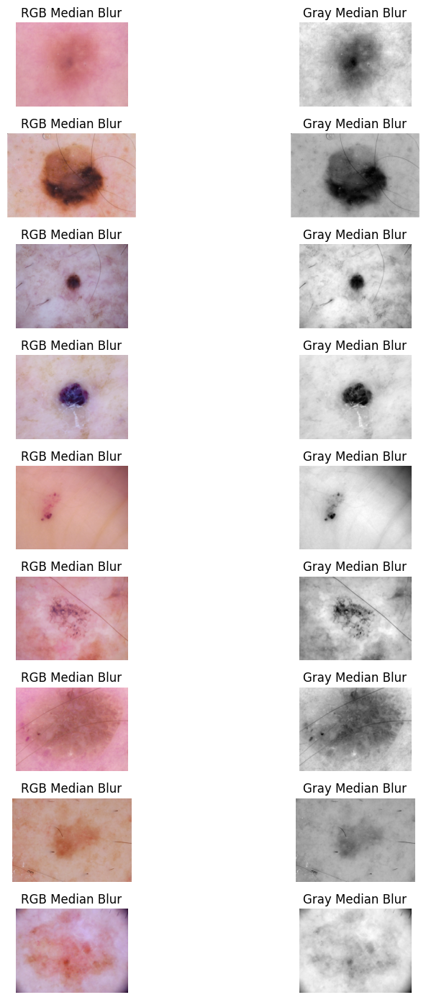

In [40]:
plt.figure(figsize=(10, 14))

for i, fp in enumerate(sample_df["filepath"]):
    img = cv2.imread(fp)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    rgb_med = cv2.medianBlur(img_rgb, 5)
    gray_med = cv2.medianBlur(img_gray, 5)

    plt.subplot(9, 2, 2*i+1)
    plt.imshow(rgb_med)
    plt.title("RGB Median Blur")
    plt.axis("off")

    plt.subplot(9, 2, 2*i+2)
    plt.imshow(gray_med, cmap="gray")
    plt.title("Gray Median Blur")
    plt.axis("off")

plt.tight_layout()
plt.show()

**4.2. Gaussian Blur Uygulama**

Gaussian Blur:

- Normal dağılım filtre çekirdeği kullanır

- Median’e göre daha fazla detay yumuşatır

- Kenarları fazla yumuşatabilir

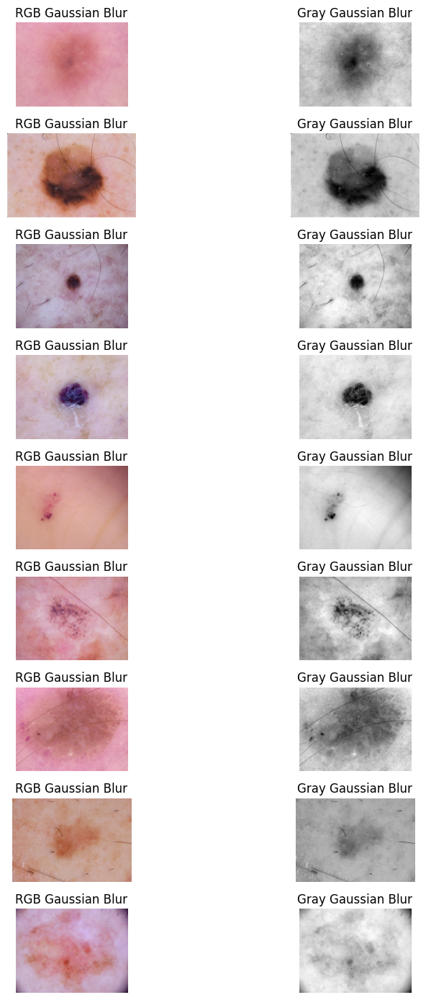

In [41]:
plt.figure(figsize=(10, 14))

for i, fp in enumerate(sample_df["filepath"]):
    img = cv2.imread(fp)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    rgb_gauss = cv2.GaussianBlur(img_rgb, (5,5), 0)
    gray_gauss = cv2.GaussianBlur(img_gray, (5,5), 0)

    plt.subplot(9, 2, 2*i+1)
    plt.imshow(rgb_gauss)
    plt.title("RGB Gaussian Blur")
    plt.axis("off")

    plt.subplot(9, 2, 2*i+2)
    plt.imshow(gray_gauss, cmap="gray")
    plt.title("Gray Gaussian Blur")
    plt.axis("off")

plt.tight_layout()
plt.show()

**BÖLÜM 5 — Döndürme (Rotate) ve Ayna Çevirme (Flip)**

Bu bölümde hem RGB hem Grayscale için:

- 0–10 derece arası rastgele döndürme

- Yatay ayna çevirme (flip)

işlemleri yapılacak.

**5.1 Rastgele Döndürme (0–10 derece)**

Kod — Hem RGB hem Grayscale döndürme

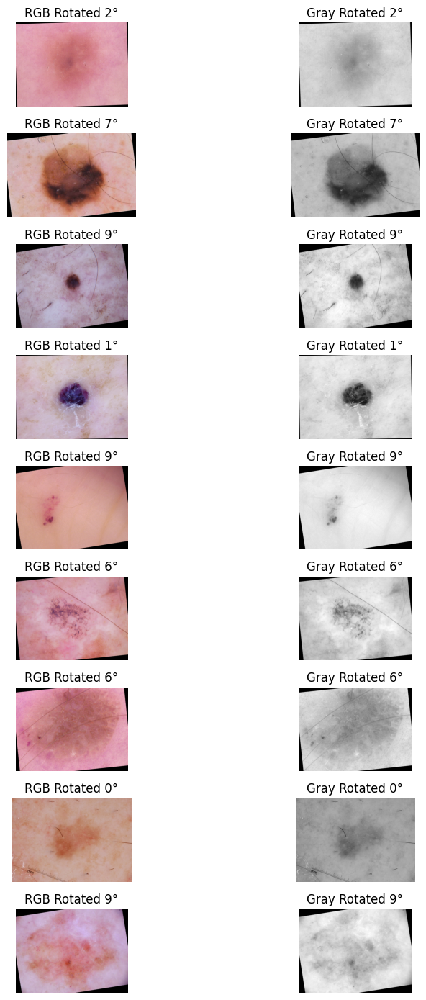

In [42]:
import random

plt.figure(figsize=(10, 14))

for i, fp in enumerate(sample_df["filepath"]):
    img = cv2.imread(fp)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    angle = random.randint(0,10)

    # Döndürme matrisi oluştur
    h, w = img_gray.shape
    center = (w//2, h//2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)

    # RGB döndürme
    rgb_rot = cv2.warpAffine(img_rgb, M, (w,h))

    # Grayscale döndürme
    gray_rot = cv2.warpAffine(img_gray, M, (w,h))

    plt.subplot(9, 2, 2*i+1)
    plt.imshow(rgb_rot)
    plt.title(f"RGB Rotated {angle}°")
    plt.axis("off")

    plt.subplot(9, 2, 2*i+2)
    plt.imshow(gray_rot, cmap="gray")
    plt.title(f"Gray Rotated {angle}°")
    plt.axis("off")

plt.tight_layout()
plt.show()

**5.2 Yatay Ayna Çevirme (Horizontal Flip)**

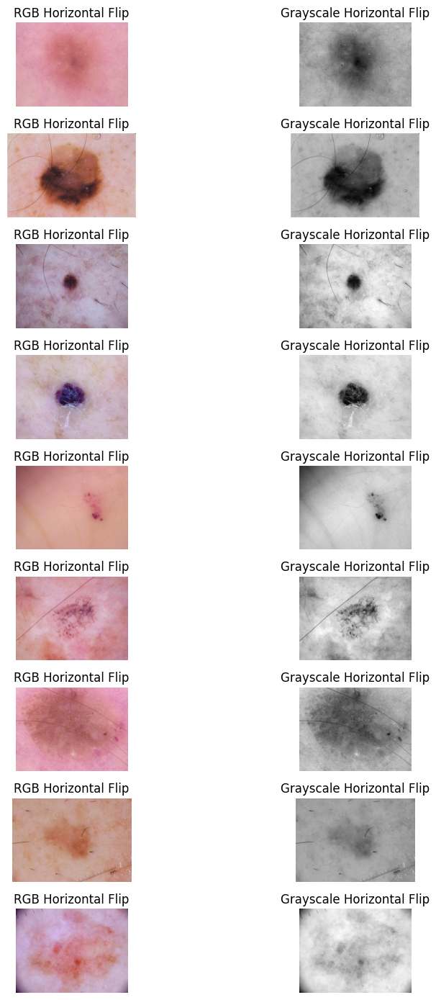

In [43]:
plt.figure(figsize=(10, 14))

for i, fp in enumerate(sample_df["filepath"]):
    img = cv2.imread(fp)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    rgb_flip = cv2.flip(img_rgb, 1)   # 1 → yatay flip
    gray_flip = cv2.flip(img_gray, 1)

    plt.subplot(9, 2, 2*i+1)
    plt.imshow(rgb_flip)
    plt.title("RGB Horizontal Flip")
    plt.axis("off")

    plt.subplot(9, 2, 2*i+2)
    plt.imshow(gray_flip, cmap="gray")
    plt.title("Grayscale Horizontal Flip")
    plt.axis("off")

plt.tight_layout()
plt.show()

**BÖLÜM 6 — FFT (Frekans Alanında Filtreleme)**

Bu bölümde:

- RGB görüntüyü grayscale’e çevirme

- FFT (Fast Fourier Transform) uygulama

- Frekans spektrumunu görselleştirme

- Alçak geçiren filtre (Low-Pass Filter) uygulama

- Inverse FFT ile uzamsal alana geri dönme

FFT işlemlerini daha iyi gösterebilmek için sample_df içinden tek bir örnek görüntü kullanacağız.
(Gerekiyorsa 9 görüntüyü de işlemden geçiririz ama FFT görsel olarak tek tek yapılır.)

Aşağıdaki kod sample_df'den ilk görüntüyü alır.

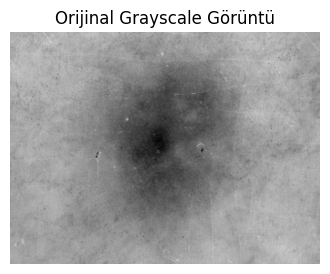

In [44]:
sample_image_path = sample_df["filepath"].iloc[0]

img = cv2.imread(sample_image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

plt.figure(figsize=(4,4))
plt.imshow(img_gray, cmap='gray')
plt.title("Orijinal Grayscale Görüntü")
plt.axis("off")
plt.show()

**6.1. Fourier Transform (FFT)**

Hem magnitude (genlik) hem de log ölçekli spektrum çıkacak.

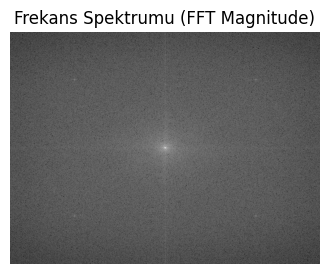

In [45]:
# FFT uygulama
f = np.fft.fft2(img_gray)
fshift = np.fft.fftshift(f)

# Magnitude spectrum
magnitude = 20 * np.log(np.abs(fshift) + 1)

plt.figure(figsize=(4,4))
plt.imshow(magnitude, cmap='gray')
plt.title("Frekans Spektrumu (FFT Magnitude)")
plt.axis("off")
plt.show()

**6.2. Alçak Geçiren Filtre (Low-Pass Filter) Oluşturma**

Merkezi beyaz (geçiriyor), kenarları siyah (kesiyor) olan bir maske oluşturuyoruz.

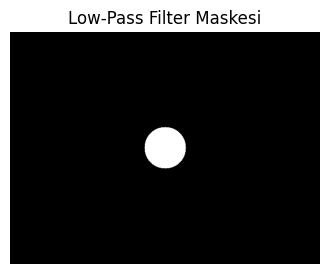

In [46]:
rows, cols = img_gray.shape
crow, ccol = rows//2, cols//2

# Dairesel maske
mask = np.zeros((rows,cols), np.uint8)
r = 40   # filtre yarıçapı (isteğe göre ayarlanabilir)
cv2.circle(mask, (ccol, crow), r, 1, -1)

plt.figure(figsize=(4,4))
plt.imshow(mask, cmap='gray')
plt.title("Low-Pass Filter Maskesi")
plt.axis("off")
plt.show()

**6.3. Maskeyi FFT üzerine uygulama**

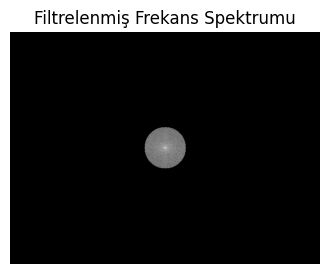

In [47]:
# Maskeyi uygulama
fshift_filtered = fshift * mask

magnitude_filtered = 20 * np.log(np.abs(fshift_filtered) + 1)

plt.figure(figsize=(4,4))
plt.imshow(magnitude_filtered, cmap='gray')
plt.title("Filtrelenmiş Frekans Spektrumu")
plt.axis("off")
plt.show()

**6.4. Inverse FFT ile Uzamsal Alana Dönüş**

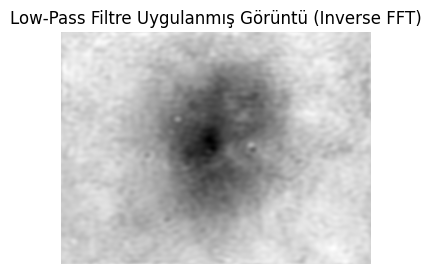

In [48]:
# Inverse FFT
f_ishift = np.fft.ifftshift(fshift_filtered)
img_filtered = np.fft.ifft2(f_ishift)
img_filtered = np.abs(img_filtered)

plt.figure(figsize=(4,4))
plt.imshow(img_filtered, cmap='gray')
plt.title("Low-Pass Filtre Uygulanmış Görüntü (Inverse FFT)")
plt.axis("off")
plt.show()

**BÖLÜM 7 – Keskinleştirme (Unsharp Masking) + Bicubic Enterpolasyon**

In [49]:
sample_image_path = sample_df["filepath"].iloc[0]

img = cv2.imread(sample_image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)


**7.1 Unsharp Masking — Keskinleştirme**

Unsharp Masking adımları:

Görüntü Gaussian blur ile yumuşatılır

Orijinal görüntüden çıkarılarak “mask” elde edilir

Mask orijinale eklenerek keskin görüntü oluşturulur

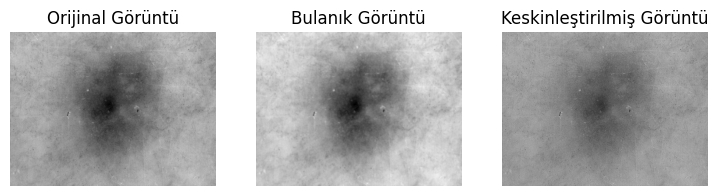

In [50]:
# Orijinal görüntüyü belirle (örneğin, img_gray kullanabiliriz)
original_img = img_gray

# Görüntüyü Gaussian blur ile yumuşat
blurred_img = cv2.GaussianBlur(original_img, (5, 5), 0)

# Maskeyi elde et
mask = original_img - blurred_img

# Keskinleştirme çarpanı (alpha) belirle
alpha = 1.5 # Bu değeri deneyerek farklı sonuçlar alabilirsiniz

# Orijinale maskeyi ekleyerek keskin görüntüyü oluştur
sharpened_img = cv2.addWeighted(original_img, 1 + alpha, blurred_img, -alpha, 0)

plt.figure(figsize=(9, 5))
plt.subplot(1, 3, 1)
plt.imshow(original_img, cmap='gray')
plt.title('Orijinal Görüntü')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(blurred_img, cmap='gray')
plt.title('Bulanık Görüntü')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(sharpened_img, cmap='gray')
plt.title('Keskinleştirilmiş Görüntü')
plt.axis('off')
plt.show()

**7.2 Bicubic Enterpolasyon – 2 Kat Büyütme**

Bicubic interpolation:

- En kaliteli büyütme yöntemlerinden biridir

- Pixel değerlerini komşu 16 piksel üzerinden hesaplar

- Daha düzgün ve doğal sonuç verir


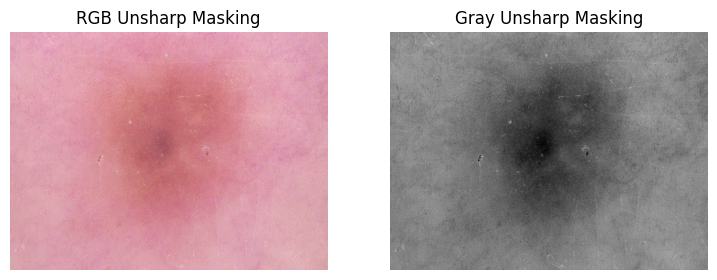

In [51]:
def unsharp_mask(img, blur_ksize=(5,5), amount=1.5):
    blurred = cv2.GaussianBlur(img, blur_ksize, 0)
    mask = cv2.subtract(img, blurred)
    sharpened = cv2.addWeighted(img, 1.0, mask, amount, 0)
    return sharpened

# RGB
rgb_sharp = unsharp_mask(img_rgb)

# Grayscale
gray_sharp = unsharp_mask(img_gray)

plt.figure(figsize=(9,5))

plt.subplot(1,2,1)
plt.imshow(rgb_sharp)
plt.title("RGB Unsharp Masking")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(gray_sharp, cmap='gray')
plt.title("Gray Unsharp Masking")
plt.axis("off")

plt.show()

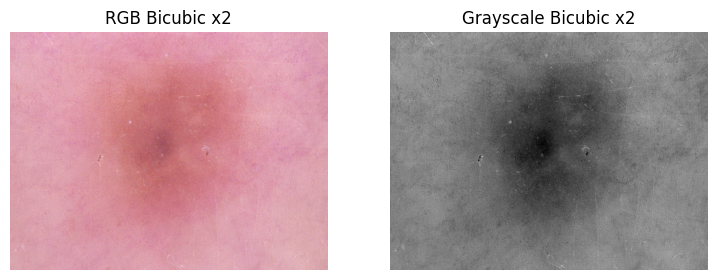

In [52]:
# RGB için 2 kat büyütme
rgb_up = cv2.resize(rgb_sharp, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)

# Gray için 2 kat büyütme
gray_up = cv2.resize(gray_sharp, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)

plt.figure(figsize=(9,5))

plt.subplot(1,2,1)
plt.imshow(rgb_up)
plt.title("RGB Bicubic x2")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(gray_up, cmap='gray')
plt.title("Grayscale Bicubic x2")
plt.axis("off")

plt.show()